In [1]:
import xarray as xr
import hvplot.pandas  # noqa
import hvplot.xarray  # noqa
import cartopy.crs as ccrs

In [2]:
ds = xr.open_dataset('D:\ECMWF\data_extraction\precip15_combined.nc')
ds

<xarray.Dataset>
Dimensions:    (latitude: 121, longitude: 281, time: 756)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * time       (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
Data variables:
    tp         (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-08-30 13:25:17 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

(array([2.328105e+07, 2.354305e+06, 5.947900e+04, 7.217000e+03,
        1.750000e+03, 5.850000e+02, 2.310000e+02, 8.500000e+01,
        3.700000e+01, 1.700000e+01]),
 array([7.4505806e-09, 1.2512595e-02, 2.5025183e-02, 3.7537772e-02,
        5.0050359e-02, 6.2562943e-02, 7.5075537e-02, 8.7588124e-02,
        1.0010071e-01, 1.1261330e-01, 1.2512589e-01], dtype=float32),
 <BarContainer object of 10 artists>)

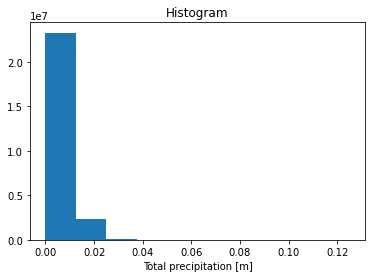

In [3]:
ds.tp.plot()

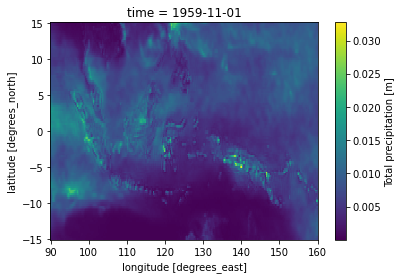

In [4]:
ds.tp.isel(time=10).plot();

In [3]:
# seasonal groups
ds.groupby("time.season")

DatasetGroupBy, grouped over 'season' 
4 groups with labels 'DJF', 'JJA', 'MAM', 'SON'.

In [4]:
# make a seasonal mean
seasonal_mean = ds.groupby("time.season").mean()
seasonal_mean

<xarray.Dataset>
Dimensions:    (latitude: 121, longitude: 281, season: 4)
Coordinates:
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Data variables:
    tp         (season, latitude, longitude) float32 0.0010126098 ... 0.0036015962

In [8]:
#seasonal_mean = seasonal_mean.sel(season=["DJF", "MAM", "JJA", "SON"])
#seasonal_mean

<xarray.Dataset>
Dimensions:    (latitude: 121, longitude: 281, season: 4)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
Data variables:
    tp         (season, latitude, longitude) float32 0.0010126098 ... 0.0036015962

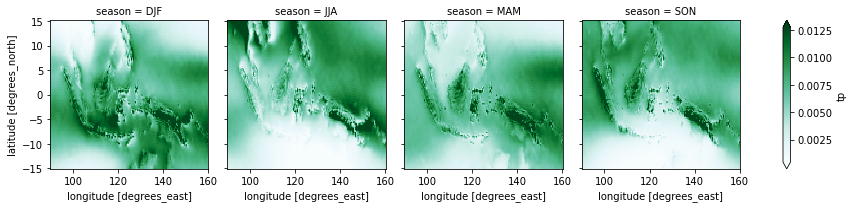

In [5]:
# facet the seasonal_mean
seasonal_mean.tp.plot(col="season",robust=True,cmap='BuGn');

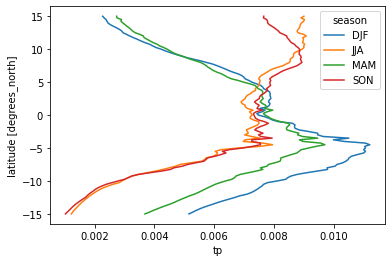

In [6]:
seasonal_mean.tp.mean("longitude").plot.line(hue="season", y="latitude");


In [7]:

monthly_means = ds.groupby("time.month").mean()
# xarray's groupby reductions drop attributes. Let's assign them back so we get nice labels.
monthly_means.tp.attrs = ds.tp.attrs

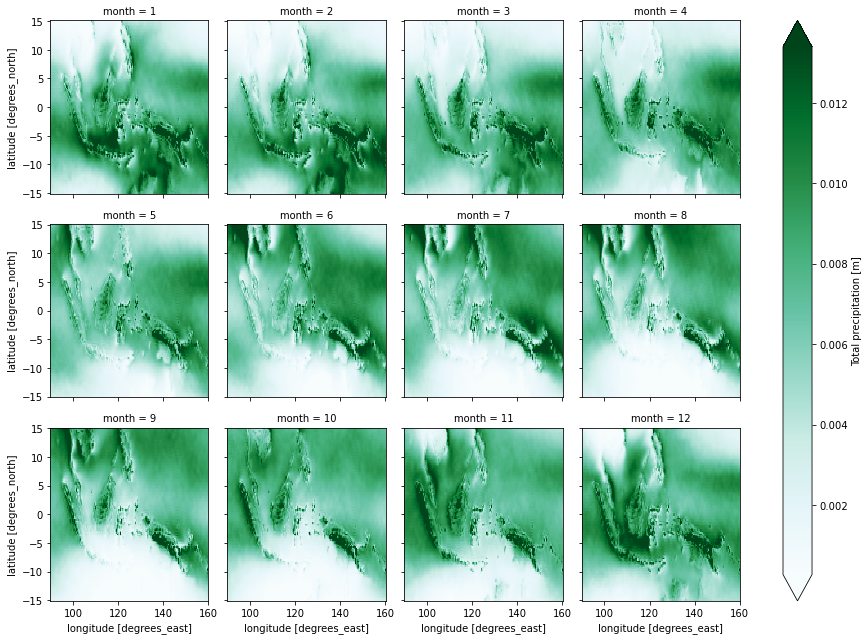

In [8]:
fg = monthly_means.tp.plot(
    col="month",
    robust=True,
    col_wrap=4,
    cmap='BuGn',# each row has a maximum of 4 columns
)

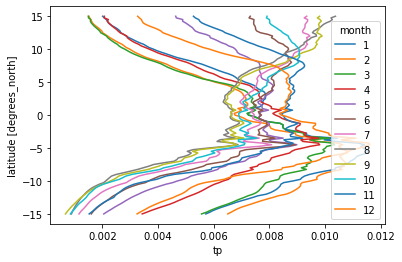

In [10]:
monthly_means.tp.mean("longitude").plot.line(hue="month", y="latitude");

In [74]:
# make a seasonal max
seasonal_max = ds.groupby("time.season").max()
seasonal_max

<xarray.Dataset>
Dimensions:    (latitude: 121, longitude: 281, season: 4)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Data variables:
    tp         (season, latitude, longitude) float32 0.011796009 ... 0.016248628

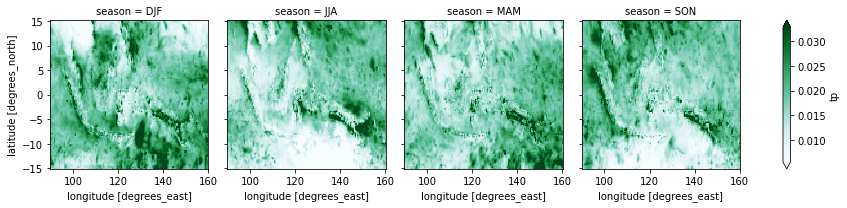

In [75]:
# facet the seasonal_mean
seasonal_max.tp.plot(col="season",robust=True,cmap='BuGn');

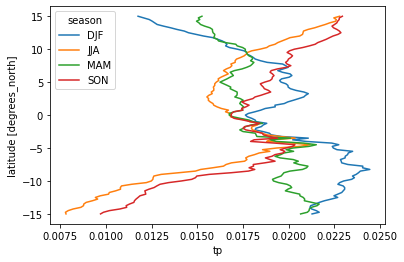

In [76]:
seasonal_max.tp.mean("longitude").plot.line(hue="season", y="latitude");

In [79]:
monthly_max = ds.groupby("time.month").max()
# xarray's groupby reductions drop attributes. Let's assign them back so we get nice labels.
monthly_max.tp.attrs = ds.tp.attrs

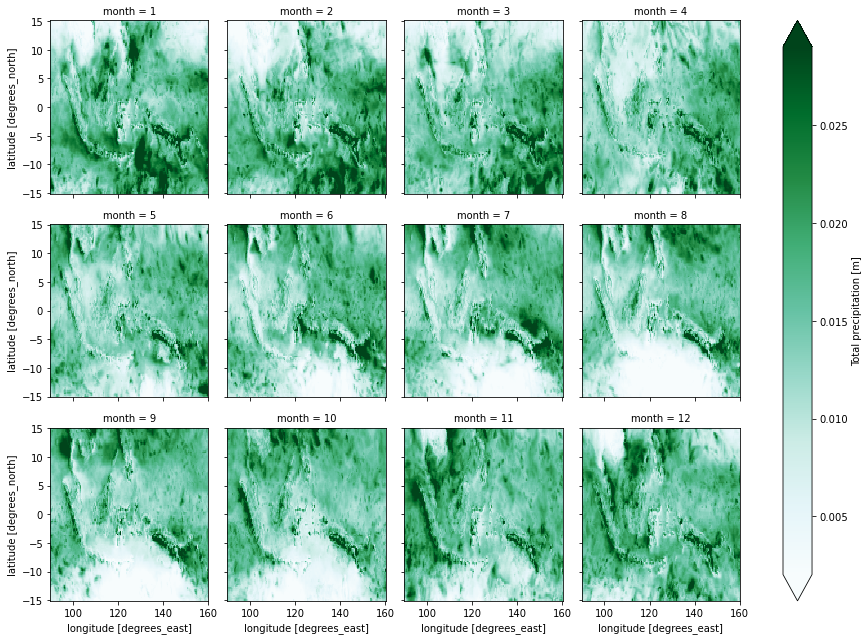

In [80]:
fg_max = monthly_max.tp.plot(
    col="month",
    robust=True,
    col_wrap=4,
    cmap='BuGn',# each row has a maximum of 4 columns
)

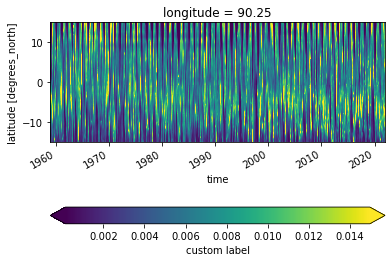

In [30]:
ds.tp.isel(longitude=1).plot(
    x="time",  # coordinate to plot on the x-axis of the plot
    robust=True,  # set colorbar limits to 2nd and 98th percentile of data
    cbar_kwargs={  # passed to plt.colorbar
        "orientation": "horizontal",
        "label": "custom label",
        "pad": 0.3,
    },
);

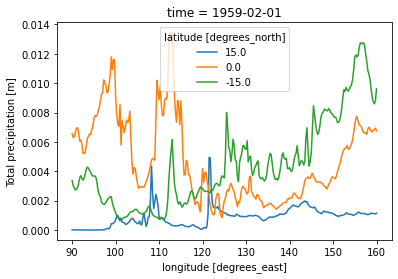

In [17]:
ds.tp.isel(time=1).sel(latitude=[15, 0, -15], method="nearest").plot(x="longitude", hue="latitude");

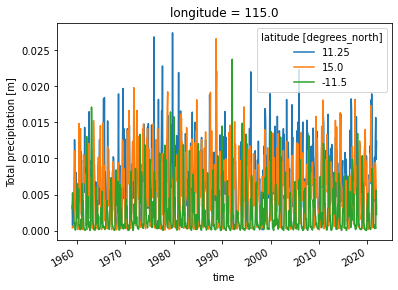

In [18]:
ds.tp.isel(longitude=100, latitude=[15, 0, -15]).plot.line(x="time");

In [5]:
precip_mean = ds.tp.mean(dim='time')
precip_mean

<xarray.DataArray 'tp' (latitude: 121, longitude: 281)>
array([[0.00575891, 0.00576891, 0.00583159, ..., 0.0035257 , 0.0034707 ,
        0.00344215],
       [0.00556581, 0.00570693, 0.00562895, ..., 0.0036191 , 0.00357967,
        0.00350589],
       [0.00557143, 0.00565634, 0.00569125, ..., 0.00371898, 0.00365146,
        0.00360281],
       ...,
       [0.00345768, 0.00345524, 0.00347048, ..., 0.00552976, 0.00562792,
        0.00571707],
       [0.00333273, 0.00330338, 0.00328903, ..., 0.00528875, 0.0053692 ,
        0.00541542],
       [0.00317269, 0.00316187, 0.00313781, ..., 0.00507478, 0.00515733,
        0.0052083 ]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0

In [6]:
precip_mean.hvplot('longitude', 'latitude', clim=(0.0, 0.02), label='Total Mean precip 1959-2021', cmap='BuGn')

:Image   [longitude,latitude]   (tp)

In [3]:
ds.hvplot.quadmesh('longitude', 'latitude', clim=(0.0, 0.02), label='Monthly Mean precip (cm/month)', cmap='BuGn')

:DynamicMap   [time]
   :QuadMesh   [longitude,latitude]   (tp)

In [16]:
ds.time

<xarray.DataArray 'time' (time: 756)>
array(['1959-01-01T00:00:00.000000000', '1959-02-01T00:00:00.000000000',
       '1959-03-01T00:00:00.000000000', ..., '2021-10-01T00:00:00.000000000',
       '2021-11-01T00:00:00.000000000', '2021-12-01T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
Attributes:
    long_name:  time

In [17]:
# july to june
resample_obj = ds.resample(time="BAS-JUL")
resample_obj

DatasetResample, grouped over '__resample_dim__' 
64 groups with labels 1958-07-01, ..., 2021-07-01.

In [18]:
ds_resample = resample_obj.mean()
ds_resample

<xarray.Dataset>
Dimensions:    (latitude: 121, longitude: 281, time: 64)
Coordinates:
  * time       (time) datetime64[ns] 1958-07-01 1959-07-01 ... 2021-07-01
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
Data variables:
    tp         (time, latitude, longitude) float32 0.002780027 ... 0.0034164793

In [19]:
ds_resample.hvplot.quadmesh('longitude', 'latitude', clim=(0.0, 0.02), label='Annual Mean precip (cm/year)', cmap='BuGn')

:DynamicMap   [time]
   :QuadMesh   [longitude,latitude]   (tp)

In [35]:
# mask data array land/ocean

In [36]:
# take mean, group by longit and take max value(with lat)

In [ ]:
# 

In [23]:
ds.max

<bound method ImplementsDatasetReduce._reduce_method.<locals>.wrapped_func of <xarray.Dataset>
Dimensions:    (latitude: 121, longitude: 281, time: 756)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * time       (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
Data variables:
    tp         (time, latitude, longitude) float32 8.7834895e-05 ... 0.006245509
Attributes:
    Conventions:  CF-1.6
    history:      2022-08-30 13:25:17 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...>

In [24]:
ds_max = ds.fillna(0.).max(dim=('time', 'longitude')).to_dataframe()
ds_max.head()

,tp
latitude,
15.00,0.058736
14.75,0.049418
14.50,0.050867
14.25,0.048272
14.00,0.045742


In [25]:
ds_max.hvplot.line(x='latitude', y='tp', grid=True, legend='top')

:Curve   [latitude]   (tp)

In [ ]:
# 

In [25]:
# ds.max(dim=['longitude', 'latitude']).hvplot(by='time', groupby=['time'])

In [26]:
ds.max('latitude').hvplot(x='longitude', line_width=4, label='Monthly max precip (cm/month)',color='green')

:DynamicMap   [time]
   :Curve   [longitude]   (tp)

In [27]:
ds.max('latitude')

<xarray.Dataset>
Dimensions:    (longitude: 281, time: 756)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * time       (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
Data variables:
    tp         (time, longitude) float32 0.012638036 0.01313065 ... 0.028054185

In [28]:
ds_resample.max('latitude').hvplot(x='longitude', line_width=4, label='Annual Max precip (cm/year)', color='green')

:DynamicMap   [time]
   :Curve   [longitude]   (tp)

In [29]:
ds.mean('latitude').hvplot(x='longitude', line_width=4, label='Monthly Mean precip (cm/month)', color='blue')

:DynamicMap   [time]
   :Curve   [longitude]   (tp)

In [30]:
ds_resample.mean('latitude').hvplot(x='longitude', line_width=4, label='Annual Mean precip (cm/year)', color='blue')

:DynamicMap   [time]
   :Curve   [longitude]   (tp)

In [34]:
df = ds.to_dataframe()
df

tp
latitude longitude time                
 15.0    90.0      1959-01-01  0.000088
                   1959-02-01  0.000011
                   1959-03-01  0.000053
                   1959-04-01  0.000894
                   1959-05-01  0.001921
                   1959-06-01  0.013713
                   1959-07-01  0.020976
                   1959-08-01  0.011330
                   1959-09-01  0.008222
                   1959-10-01  0.006857
                   1959-11-01  0.002536
                   1959-12-01  0.001083
                   1960-01-01  0.000139
                   1960-02-01  0.000197
                   1960-03-01  0.000006
                   1960-04-01  0.000055
                   1960-05-01  0.003756
                   1960-06-01  0.015903
                   1960-07-01  0.005795
                   1960-08-01  0.008348
                   1960-09-01  0.008182
                   1960-10-01  0.010032
                   1960-11-01  0.006708
                   1960-12-01  0.004027
                   1961-01-01  0.000850
                   1961-02-01  0.000040
                   1961-03-01  0.000027
                   1961-04-01  0.000231
                   1961-05-01  0.007511
                   1961-06-01  0.012119
...                                 ...
-15.0    160.0     2019-07-01  0.000611
                   2019-08-01  0.003992
                   2019-09-01  0.002532
                   2019-10-01  0.001831
                   2019-11-01  0.001167
                   2019-12-01  0.003565
                   2020-01-01  0.003805
                   2020-02-01  0.005295
                   2020-03-01  0.007347
                   2020-04-01  0.011168
                   2020-05-01  0.005130
                   2020-06-01  0.005218
                   2020-07-01  0.001421
                   2020-08-01  0.001804
                   2020-09-01  0.004422
                   2020-10-01  0.007924
                   2020-11-01  0.016249
                   2020-12-01  0.001898
                   2021-01-01  0.017629
                   2021-02-01  0.004430
                   2021-03-01  0.014196
                   2021-04-01  0.011575
                   2021-05-01  0.003414
                   2021-06-01  0.001136
                   2021-07-01  0.002625
                   2021-08-01  0.001634
                   2021-09-01  0.001864
                   2021-10-01  0.005285
                   2021-11-01  0.002845
                   2021-12-01  0.006246

[25704756 rows x 1 columns]

In [35]:
# df = df.to_csv('df_precip.csv')
# df

In [34]:
# panda group by datafram, group lat

# index by max lat tp

# the lat of higest rainfall

# https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects


In [23]:
# The latitude of the maximum value for each longitude: 
# da.idxmax(dim="latitude")

# To get the actual value of the maximum for each longitude:
# da.max(dim="latitude")

In [3]:
dfa = ds.to_array()
dfa

<xarray.DataArray (variable: 1, time: 756, latitude: 121, longitude: 281)>
array([[[[8.78348947e-05, 1.03108585e-04, 7.63796270e-05, ...,
          7.80932605e-04, 8.57304782e-04, 8.61123204e-04],
         [8.21053982e-05, 7.25612044e-05, 5.53727150e-05, ...,
          8.49667937e-04, 8.74489546e-04, 8.82126391e-04],
         [5.53727150e-05, 6.68317080e-05, 7.44685531e-05, ...,
          9.06948000e-04, 8.89763236e-04, 9.60409641e-04],
         ...,
         [1.34419277e-03, 1.36710331e-03, 1.33464485e-03, ...,
          9.30048153e-03, 9.22983512e-03, 9.30048153e-03],
         [1.35755539e-03, 1.31937116e-03, 1.24299526e-03, ...,
          9.50478390e-03, 9.32530314e-03, 9.06753913e-03],
         [1.20289996e-03, 1.13989040e-03, 1.09024718e-03, ...,
          9.25465673e-03, 9.10763443e-03, 9.20501351e-03]],

        [[1.14589930e-05, 5.72949648e-06, 5.72949648e-06, ...,
          1.09979510e-03, 1.10361353e-03, 1.13989040e-03],
         [3.82214785e-06, 7.64429569e-06, 3.82214785e-06, ...,
          1.07306242e-03, 1.17616728e-03, 1.14943832e-03],
         [3.82214785e-06, 3.82214785e-06, 1.91479921e-06, ...,
          1.07688084e-03, 1.03296712e-03, 9.94779170e-04],
         ...,
         [3.73852625e-03, 3.65451351e-03, 3.41011584e-03, ...,
          7.94674829e-03, 9.10572708e-03, 9.86374170e-03],
         [3.50940228e-03, 3.35283577e-03, 3.26309353e-03, ...,
          7.94865564e-03, 8.55774060e-03, 9.18209925e-03],
         [3.37192789e-03, 3.02251428e-03, 2.85258144e-03, ...,
          8.58638063e-03, 8.80404934e-03, 9.61361453e-03]],

        [[5.34653664e-05, 6.49206340e-05, 5.91948628e-05, ...,
          9.31769609e-04, 9.62320715e-04, 9.56591219e-04],
         [7.06501305e-05, 8.21053982e-05, 8.40164721e-05, ...,
          9.92868096e-04, 9.48954374e-04, 9.48954374e-04],
         [1.08838081e-04, 1.06927007e-04, 8.97422433e-05, ...,
          1.06351450e-03, 1.07879192e-03, 1.10552087e-03],
         ...,
         [3.12180072e-03, 3.26309353e-03, 3.21154296e-03, ...,
          4.88795713e-03, 5.26409969e-03, 5.62115014e-03],
         [3.21154296e-03, 3.17335501e-03, 3.19053978e-03, ...,
          3.96192074e-03, 4.27887216e-03, 4.48890030e-03],
         [3.01678851e-03, 3.08552384e-03, 3.24400142e-03, ...,
          3.52658704e-03, 3.68697196e-03, 3.79007682e-03]],

        ...,

        [[6.46890327e-03, 6.35816157e-03, 6.41353428e-03, ...,
          6.83168322e-03, 6.18059188e-03, 5.83881885e-03],
         [6.48036227e-03, 6.62356243e-03, 6.30088151e-03, ...,
          6.71903044e-03, 6.08894229e-03, 5.55241480e-03],
         [6.86605275e-03, 6.90614805e-03, 6.91378489e-03, ...,
          6.69420883e-03, 5.82354143e-03, 5.66315651e-03],
         ...,
         [4.42207605e-03, 4.31896746e-03, 4.40679863e-03, ...,
          4.43734974e-03, 4.66265157e-03, 5.17626852e-03],
         [3.54377180e-03, 3.75379995e-03, 3.86645272e-03, ...,
          3.57623026e-03, 3.96000966e-03, 5.14572114e-03],
         [2.90604681e-03, 3.05688381e-03, 3.15426290e-03, ...,
          3.71561199e-03, 3.96955758e-03, 5.28510287e-03]],

        [[6.11185655e-03, 5.81781566e-03, 5.56959957e-03, ...,
          2.74183974e-03, 2.66928598e-03, 2.65210122e-03],
         [6.06221333e-03, 6.01447746e-03, 5.44166937e-03, ...,
          2.56999955e-03, 2.52799317e-03, 2.38670036e-03],
         [7.01307133e-03, 7.12381303e-03, 6.50327280e-03, ...,
          2.65019014e-03, 2.29505077e-03, 2.18239799e-03],
         ...,
         [4.20631841e-03, 4.32278961e-03, 4.06693295e-03, ...,
          3.68315354e-03, 3.53040546e-03, 3.35283577e-03],
         [3.51895019e-03, 3.76143679e-03, 3.60295922e-03, ...,
          3.26118618e-03, 3.41393426e-03, 3.10080126e-03],
         [3.22872773e-03, 3.30701098e-03, 3.23063508e-03, ...,
          4.05357033e-03, 3.18290293e-03, 2.84494460e-03]],

        [[2.51271576e-03, 2.58145481e-03, 2.32942030e-03, ...,
          2.22631544e-03, 2.19576433e-03, 2.20149383e-03],
         [2.56427005e-03, 2.32178345e-03, 2.38860

In [84]:
#maxlat_dfa = dfa.max(dim="longitude")
#maxlat_dfa 

In [82]:
# maxlat_dfa.plot(robust=True)

In [56]:
# maxlatarg_dfa = dfa.argmax(dim="longitude")
# maxlatarg_dfa

In [55]:
# maxlatarg_dfa.plot()

In [85]:
# maxlat_dfa.hvplot(x='latitude', line_width=4, label='Annual Max precip (cm/year)', color='navy')

In [4]:
maxlon_dfa = dfa.max(dim="latitude")
maxlon_dfa 

<xarray.DataArray (variable: 1, time: 756, longitude: 281)>
array([[[0.01263804, 0.01313065, 0.01296645, ..., 0.02683983,
         0.02498585, 0.02407699],
        [0.0099363 , 0.00824651, 0.00744077, ..., 0.01732169,
         0.01712121, 0.01648157],
        [0.01555935, 0.01543524, 0.01554217, ..., 0.01519467,
         0.01702383, 0.01521185],
        ...,
        [0.01314593, 0.01333304, 0.01339796, ..., 0.00980837,
         0.01607106, 0.01374165],
        [0.01661141, 0.01641284, 0.01614552, ..., 0.01771311,
         0.01809116, 0.01749353],
        [0.01734078, 0.01668778, 0.01470587, ..., 0.02966377,
         0.02934682, 0.02805419]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * time       (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
  * variable   (variable) <U2 'tp'

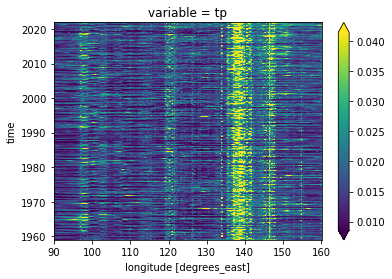

In [34]:
maxlon_dfa.plot(robust=True);

In [88]:
maxlon_dfa.hvplot(x='longitude', line_width=4, label='Annual Max precip (cm/year)', color='navy')

:DynamicMap   [variable,time]
   :Curve   [longitude]   (Annual Max precip (cm/year))

In [85]:
# maxlat_dfa
# maxlon_dfa

# maxlat_cdf = maxlat_dfa.to_netcdf()
# maxlon_cdf = maxlon_dfa.to_netcdf()


In [81]:
# maxlat = './maxlat.nc'
#print ('saving to ', maxlat)
#maxlat_dfa.to_netcdf(path=maxlat)
#maxlat_dfa.close()
#print ('finished saving')

In [59]:
#maxlon = './maxlon.nc'
#print ('saving to ', maxlon)
#maxlon_dfa.to_netcdf(path=maxlon)
#maxlon_dfa.close()
#print ('finished saving')


saving to  ./maxlon.nc
finished saving


In [60]:
maxlat = xr.open_dataset('./maxlat.nc')
maxlat['max_tp_lat'] = maxlat['__xarray_dataarray_variable__']
maxlat = maxlat.drop(['__xarray_dataarray_variable__'])
maxlat

<xarray.Dataset>
Dimensions:     (latitude: 121, time: 756, variable: 1)
Coordinates:
  * latitude    (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * time        (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
  * variable    (variable) object 'tp'
Data variables:
    max_tp_lat  (variable, time, latitude) float32 ...

In [61]:
maxlon = xr.open_dataset('./maxlon.nc')
maxlon['max_tp_lon'] = maxlon['__xarray_dataarray_variable__']
maxlon = maxlon.drop(['__xarray_dataarray_variable__'])
maxlon

<xarray.Dataset>
Dimensions:     (longitude: 281, time: 756, variable: 1)
Coordinates:
  * longitude   (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
  * time        (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
  * variable    (variable) object 'tp'
Data variables:
    max_tp_lon  (variable, time, longitude) float32 ...

In [62]:
max_merge = xr.merge([maxlat,maxlon])
max_merge

<xarray.Dataset>
Dimensions:     (latitude: 121, longitude: 281, time: 756, variable: 1)
Coordinates:
  * latitude    (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * time        (time) datetime64[ns] 1959-01-01 1959-02-01 ... 2021-12-01
  * variable    (variable) object 'tp'
  * longitude   (longitude) float32 90.0 90.25 90.5 90.75 ... 159.5 159.75 160.0
Data variables:
    max_tp_lat  (variable, time, latitude) float32 ...
    max_tp_lon  (variable, time, longitude) float32 ...

In [73]:
# max_merge.hvplot(x='longitude', line_width=4, label='Annual Max precip (cm/year)', cmap='BuGn')